# Shape As Point / Pyvista

The authors of Shape As Point introduce a new GPU-based approach with a new layer that significantly speeds up mesh generation from point clouds.


In [ ]:
import torch
from google.colab import files
# install the latest release of PyTorch3D
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith("1.13.") and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{pyt_version_str}"
        ])
        !pip install fvcore iopath
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !curl -LO https://github.com/NVIDIA/cub/archive/1.10.0.tar.gz
        !tar xzf 1.10.0.tar.gz
        os.environ["CUB_HOME"] = os.getcwd() + "/cub-1.10.0"
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'



# download the dependencies
!pip install trimesh
!pip install plyfile
!pip install libigl
!pip3 install open3d
!pip install ipdb
!pip install torch-scatter



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 KB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61431 sha256=2c274165db72674b4bb718eb86933d7c7f51f6b8c0f654cc89ae213bda76e172
  Stored in directory: /root/.cache/pip/wheels/b8/79/07/c0e9367f5b5ea325e246bd73651e8af175fabbef943043b1cc
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31547 sha256=43c33bbd49ca5946e210960209e7e4b187173a559f780541ce92dc2b699c6ab0
  Stored in directory: /root/.cache/pip/wheels/89/3e/24/0f349c0b2eeb6965903035f3b00dbb5c9bea437b4a2f18d82c
Successfully built fvcore iopath
Looking in links: https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/py38_cu116_pyt1131/dow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 783.1/783.1 KB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.4/386.4 KB 26.9 MB/s eta 0:00:00
  Attempting uninstall: prompt-toolkit
    Found existing installation: prompt-toolkit 2.0.10
    Uninstalling prompt-toolkit-2.0.10:
      Successfully uninstalled prompt-toolkit-2.0.10
  Attempting uninstall: ipython
    Found existing installation: ipython 7.9.0
    Uninstalling ipython-7.9.0:
      Successfully uninstalled ipython-7.9.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipython~=7.9.0, but you have ipython 8.9.0 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━

# Download the optim data

In [ ]:
!bash scripts/download_optim_data.sh

Start downloading data for optimization-based setting (~200 MB)
--2023-02-09 10:49:54--  https://s3.eu-central-1.amazonaws.com/avg-projects/shape_as_points/data/optim_data.zip
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 52.219.169.121
Connecting to s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)|52.219.169.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106940829 (102M) [application/zip]
Saving to: ‘optim_data.zip’

optim_data.zip      100%[===================>] 101.99M  27.5MB/s    in 4.4s    

2023-02-09 10:49:59 (23.2 MB/s) - ‘optim_data.zip’ saved [106940829/106940829]

Archive:  optim_data.zip
   creating: deep_geometric_prior_data/
  inflating: deep_geometric_prior_data/anchor.ply  
  inflating: deep_geometric_prior_data/daratech.ply  
  inflating: deep_geometric_prior_data/dc.ply  
  inflating: deep_geometric_prior_data/gargoyle.ply  
  inflating: deep_geometric_prior_data/lord_quas.ply  
   creating: dfa

# Clone the repo shape_as_points

In [ ]:
#!git clone https://github.com/autonomousvision/shape_as_points.git
%cd shape_as_points

/content/shape_as_points


In [ ]:
!unzip ../shapenet_cuniform.zip

/content/shape_as_points


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np; np.set_printoptions(precision=4)
import shutil, argparse, time, os
import pandas as pd
from collections import defaultdict
from src import config
from src.utils import mc_from_psr, export_mesh, export_pointcloud
from src.dpsr import DPSR
from src.training import Trainer
from src.model import Encode2Points
from src.utils import load_config, load_model_manual, scale2onet, is_url, load_url
from tqdm import tqdm
from pdb import set_trace as st
import open3d as o3d
from src.utils import scale2onet
!pip install trimesh # install trimesh
import trimesh
import matplotlib.pyplot as plt


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# SAP -> from unoriented point clouds to meshes

In [ ]:
def export_mesh(v, f):
    if len(v.shape) > 2:
        v, f = v[0], f[0]
    if isinstance(v, torch.Tensor):
        v = v.detach().cpu().numpy()
        f = f.detach().cpu().numpy()
    mesh = o3d.geometry.TriangleMesh()
    mesh.vertices = o3d.utility.Vector3dVector(v)
    mesh.triangles = o3d.utility.Vector3iVector(f)
    return mesh
def gen_mesh_shape_as_point(FILE_MODEL, data, out_file='./mesh.off'):
  cfg = load_config(FILE_MODEL,'configs/default.yaml')
  use_cuda = torch.cuda.device_count()
  device = torch.device("cuda" if use_cuda else "cpu")
  data_type = cfg['data']['data_type']
  input_type = cfg['data']['input_type']  
  vis_n_outputs = cfg['generation']['vis_n_outputs']
  if vis_n_outputs is None:
      vis_n_outputs = -1
  # Shorthands
  out_dir = cfg['train']['out_dir']
  if not out_dir:
      os.makedirs(out_dir)
  generation_dir = os.path.join(out_dir, cfg['generation']['generation_dir'])
  print('generation_dir: ',generation_dir)
  out_time_file = os.path.join(generation_dir, 'time_generation_full.pkl')
  out_time_file_class = os.path.join(generation_dir, 'time_generation.pkl')
  model = Encode2Points(cfg).to(device)
  # load model
  try:
      if is_url(cfg['test']['model_file']):
          #state_dict = load_url(cfg['test']['model_file'])
          state_dict = torch.hub.load_state_dict_from_url(cfg['test']['model_file'],map_location=torch.device('cpu'))
      elif cfg['generation'].get('iter', 0)!=0:
          state_dict = torch.load(os.path.join(out_dir, 'model', '%04d.pt'% cfg['generation']['iter']))
          generation_dir += '_%04d'%cfg['generation']['iter']
      #elif args.iter is not None:
      #    state_dict = torch.load(os.path.join(out_dir, 'model', '%04d.pt'% args.iter))
      else:
          state_dict = torch.load(os.path.join(out_dir, 'model_best.pt'))

      load_model_manual(state_dict['state_dict'], model)

  except:
      print('Model loading error. Exiting.')
      exit()


  # Generator
  generator = config.get_generator(model, cfg, device=device)
  print('====================== MODEL')
  print(model.eval())
  # setup
  dpsr = DPSR(res=(cfg['generation']['psr_resolution'], 
                    cfg['generation']['psr_resolution'], 
                    cfg['generation']['psr_resolution']), 
              sig= cfg['generation']['psr_sigma']).to(device)
  # generate the mesh
  out = generator.generate_mesh(data)
  v, f, points, normals, stats_dict = out
  mesh=export_mesh(scale2onet(v), f)

  # save mesh
  o3d.io.write_triangle_mesh(out_file, mesh)

In [ ]:
# load data
points = torch.load('./shapenet_csinrand/points.pt')
data=dict(inputs=torch.Tensor(points)[19][None,:])

In [ ]:
data['inputs'].shape

torch.Size([1, 4096, 3])

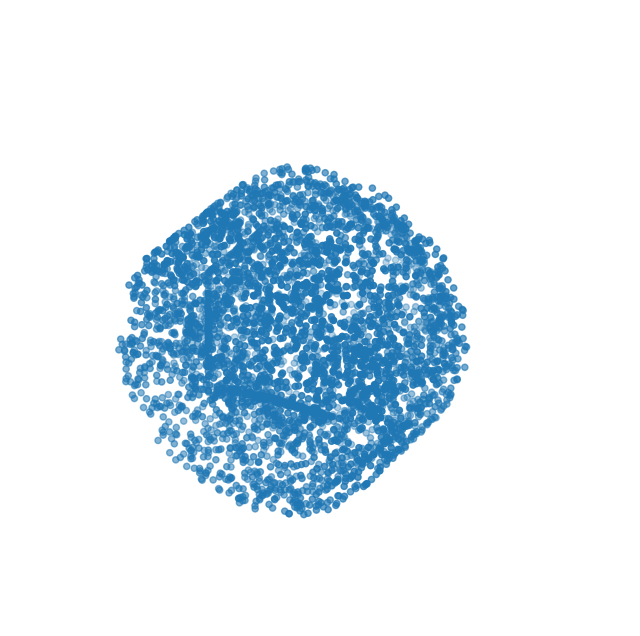

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")
xyz = data.get('inputs', torch.empty(1, 0))[0]
ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2])
ax.set_axis_off()
plt.show()

In [ ]:
# is config file to load the model
  # with 'configs/learning_based/outlier/ours_7x_pretrained.yaml' modify folder 'configs/learning_based/outlier/ours_7x.yaml'
FILE_MODEL = ['configs/learning_based/outlier/ours_1x_pretrained.yaml'
              'configs/learning_based/outlier/ours_2x_pretrained.yaml',
              'configs/learning_based/outlier/ours_3x_pretrained.yaml',
              'configs/learning_based/outlier/ours_4x_pretrained.yaml',
              'configs/learning_based/outlier/ours_5x_pretrained.yaml',
              'configs/learning_based/outlier/ours_6x_pretrained.yaml',
              'configs/learning_based/outlier/ours_7x_pretrained.yaml',
              'configs/learning_based/noise_small/ours_pretrained.yaml',
              'configs/learning_based/noise_large/ours_pretrained.yaml']

# generate the mesh and store those mesh in a file
gen_mesh_shape_as_point(FILE_MODEL[6], data)

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


generation_dir:  out/shapenet/noise_005_ours/generation_pretrained
====================== MODEL
Encode2Points(
  (encoder): LocalPoolPointnet(
    (fc_pos): Linear(in_features=3, out_features=64, bias=True)
    (blocks): ModuleList(
      (0): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features=32, bias=False)
      )
      (1): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features=32, bias=False)
      )
      (2): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features

***load and check the quality of the mesh***

In [ ]:
mesh = trimesh.load('./mesh.off')
mesh.show()

### Do some tests with their data

In [ ]:
mesh = trimesh.load('./data/thingi/120477.off')
mesh.show()

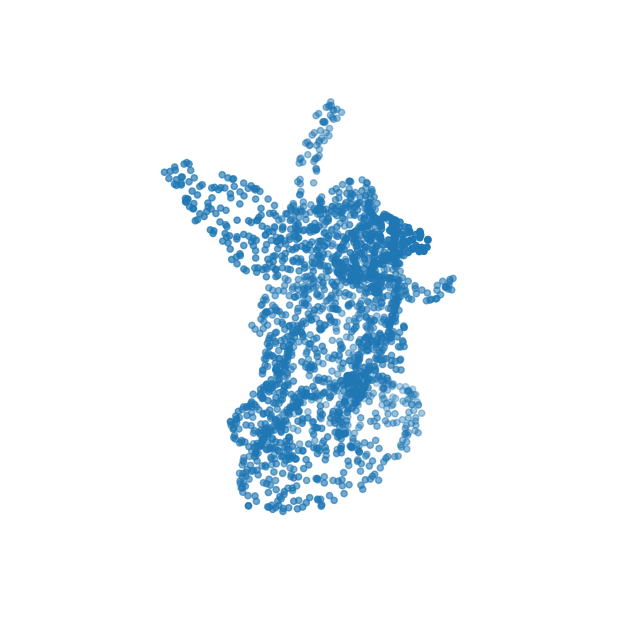

In [ ]:
points = mesh.sample(2096)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(points[:, 0], points[:, 1], points[:, 2])
ax.set_axis_off()
plt.show()

In [ ]:
# load data
data=dict(inputs=torch.Tensor(points)[None,:])
# is config file to load the model
  # with 'configs/learning_based/outlier/ours_7x_pretrained.yaml' modify folder 'configs/learning_based/outlier/ours_7x.yaml'
FILE_MODEL = ['configs/learning_based/outlier/ours_1x_pretrained.yaml'
              'configs/learning_based/outlier/ours_2x_pretrained.yaml',
              'configs/learning_based/outlier/ours_3x_pretrained.yaml',
              'configs/learning_based/outlier/ours_4x_pretrained.yaml',
              'configs/learning_based/outlier/ours_5x_pretrained.yaml',
              'configs/learning_based/outlier/ours_6x_pretrained.yaml',
              'configs/learning_based/outlier/ours_7x_pretrained.yaml',
              'configs/learning_based/noise_small/ours_pretrained.yaml',
              'configs/learning_based/noise_large/ours_pretrained.yaml']

# generate the mesh and store those mesh in a file
gen_mesh_shape_as_point(FILE_MODEL[6], data)

generation_dir:  out/shapenet/noise_005_ours/generation_pretrained
====================== MODEL
Encode2Points(
  (encoder): LocalPoolPointnet(
    (fc_pos): Linear(in_features=3, out_features=64, bias=True)
    (blocks): ModuleList(
      (0): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features=32, bias=False)
      )
      (1): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features=32, bias=False)
      )
      (2): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features

In [ ]:
gen_mesh = trimesh.load('./mesh.off')
gen_mesh.show()

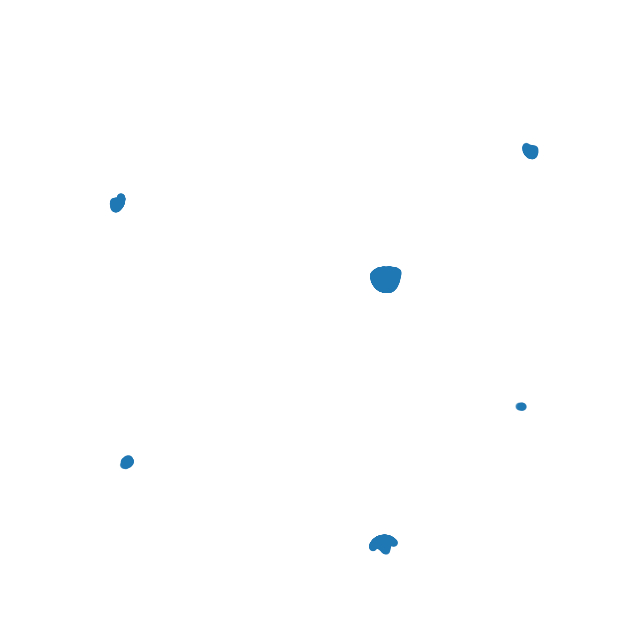

In [ ]:
genpoints = gen_mesh.sample(2096)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(genpoints[:, 0], genpoints[:, 1], genpoints[:, 2])
ax.set_axis_off()
plt.show()

In [ ]:
# load data
data=dict(inputs=torch.Tensor(points)[None,:])
# is config file to load the model
  # with 'configs/learning_based/outlier/ours_7x_pretrained.yaml' modify folder 'configs/learning_based/outlier/ours_7x.yaml'
FILE_MODEL = ['configs/learning_based/outlier/ours_1x_pretrained.yaml'
              'configs/learning_based/outlier/ours_2x_pretrained.yaml',
              'configs/learning_based/outlier/ours_3x_pretrained.yaml',
              'configs/learning_based/outlier/ours_4x_pretrained.yaml',
              'configs/learning_based/outlier/ours_5x_pretrained.yaml',
              'configs/learning_based/outlier/ours_6x_pretrained.yaml',
              'configs/learning_based/outlier/ours_7x_pretrained.yaml',
              'configs/learning_based/noise_small/ours_pretrained.yaml',
              'configs/learning_based/noise_large/ours_pretrained.yaml']

# generate the mesh and store those mesh in a file
gen_mesh_shape_as_point(FILE_MODEL[5], data)

generation_dir:  out/shapenet/outlier_ours_7x/generation_pretrained
====================== MODEL
Encode2Points(
  (encoder): LocalPoolPointnet(
    (fc_pos): Linear(in_features=3, out_features=64, bias=True)
    (blocks): ModuleList(
      (0): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features=32, bias=False)
      )
      (1): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_features=32, bias=False)
      )
      (2): ResnetBlockFC(
        (fc_0): Linear(in_features=64, out_features=32, bias=True)
        (fc_1): Linear(in_features=32, out_features=32, bias=True)
        (actvn): ReLU()
        (shortcut): Linear(in_features=64, out_feature

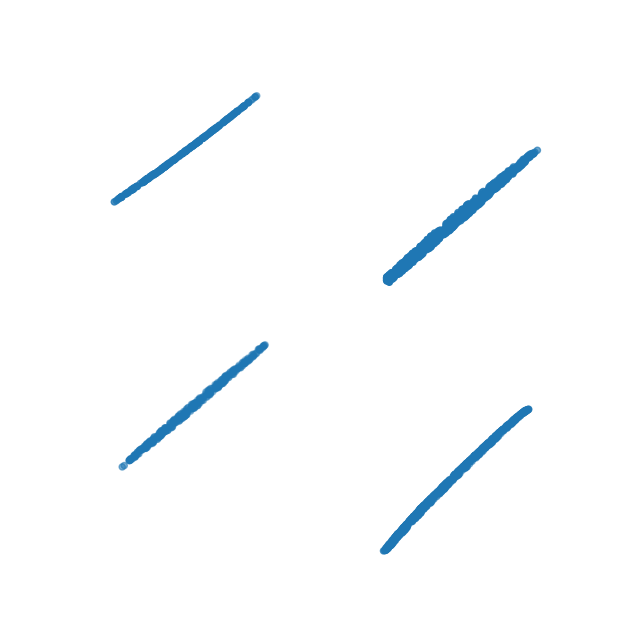

In [ ]:
genpoints = gen_mesh.sample(2096)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(genpoints[:, 0], genpoints[:, 1], genpoints[:, 2])
ax.set_axis_off()
plt.show()

# SAP for Optimization-based 3D Reconstruction

In [ ]:
# load data
points = torch.load('./shapenet_csinrand/points.pt')
cloud=trimesh.PointCloud(points[0])
cloud.export('data/thingi/demo.ply')

**Before run the command you should change the parameter in the config file...**
+ the path of the taarget point cloud
+ the number of epoch
+ ...

Although the results on meshes are excellent. The learning process takes approximately 1600 epochs. Therefore it requires a considerable amount of time on Colab.

<p align="center">
  <img width="100%" src="../img/optim_sap.png" />
</p>

In [ ]:
!python optim_hierarchy.py configs/optim_based/teaser.yaml

In [ ]:
gen_mesh = trimesh.load('out/demo_optim/res_32/vis/mesh/0000.ply')
gen_mesh.show()
# here the problem is that it require to many epoch

In [ ]:
gen_mesh = trimesh.load('data/thingi/120477.ply')

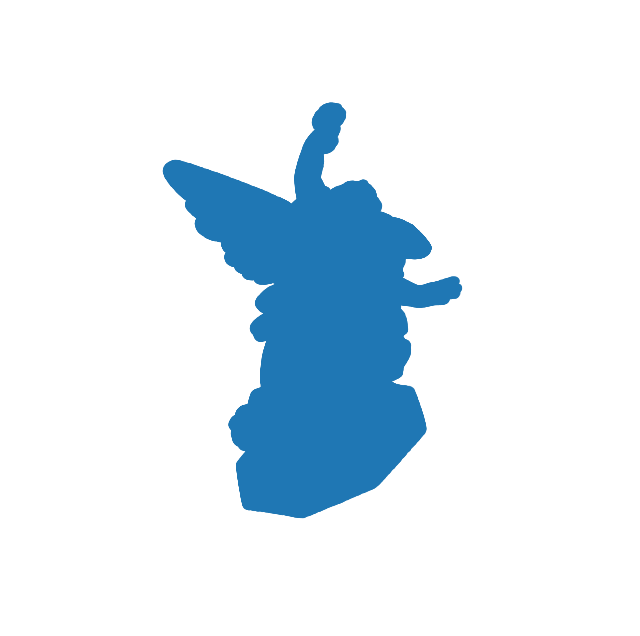

In [ ]:
genpoints=gen_mesh.vertices
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(genpoints[:, 0], genpoints[:, 1], genpoints[:, 2])
ax.set_axis_off()
plt.show()

***With py vista from the pointclud we can instantly generate the optimized mesh***

In [ ]:
!pip install pyvista

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pyvista as pv

In [ ]:
# original pointcloud
points = torch.load('./shapenet_csinrand/points.pt')
point_cloud = pv.PolyData(points[0])
mesh = point_cloud.reconstruct_surface()

In [ ]:
mesh.save('./temp.stl')

In [ ]:
gen_mesh = trimesh.load('./temp.stl')
gen_mesh.show()